In [1]:
from __future__ import print_function
import pandas as pd
import numpy as np
import datetime
import matplotlib.dates as mdates
import seaborn as sns; sns.set()
sns.set_context("poster",font_scale=0.5,rc={"font":"helvetica"});
sns.set_style("white"); #sns.set_style("ticks")
cp = sns.color_palette("colorblind") #sns.palplot(current_palette)
%matplotlib inline
%config InlineBackend.figure_format = "retina"
import matplotlib.pyplot as plt
import sys
sys.path.append("../src/")

import getpass
# Remove gks paths (not needed for anyone else)
if getpass.getuser()=="gks":
    try:
        sys.path.remove("/Users/gks/Dropbox/mypylib/notebooks/GIT/transitMCMC/src")
        sys.path.remove("/Users/gks/Dropbox/mypylib")
    except Exception as e:
        print(e)
        print("Paths already removed")

In [2]:
from priors import PriorSet, UP, NP, JP
import tf
import pyde
import mcmc_utils
from exotk.utils.likelihood import ll_normal_ev_py, ll_normal_es, ll_normal_ev
import batman
import math
import epicblsmulti
import k2help
import utils

# Get K2 data

INFO  [everest.user.DownloadFile()]: Found cached file.
INFO  [everest.user.load_fits()]: Loading FITS file for 211969807.
('Transitmask:', array([], dtype=int64))
Using *GP* to flatten (can be 'GP', 'Median', or default to SavGol)
there can still be leftover bad points, so sigma clipping is recommended
Also might be good to rerun with transitmask set
WARNING [astropy._showwarning()]: Input data contains invalid values (NaNs or infs), which were automatically masked.


/Users/Sophie/anaconda2/lib/python2.7/site-packages/astropy/stats/sigma_clipping.py:158: RuntimeWarning: invalid value encountered in greater
  _filtered_data.mask |= _filtered_data > max_value
/Users/Sophie/anaconda2/lib/python2.7/site-packages/astropy/stats/sigma_clipping.py:159: RuntimeWarning: invalid value encountered in less
  _filtered_data.mask |= _filtered_data < min_value


3663
3485
Using period range [  1.  50.]
Overwriting: df= [  9.80000000e-05] fmin= 0.02 freq_range [ 0.02  1.  ]
Computing bls...
=====Results====
Best period: 1.97444281224
Best freq: 0.506472
Depth: 0.00108299695057
Epoch: 2307.37830128
Number of transits: 37
Optimization terminated successfully.
('Per=', 1.9743134209454618, 'epoch=', 2307.3777071374993)


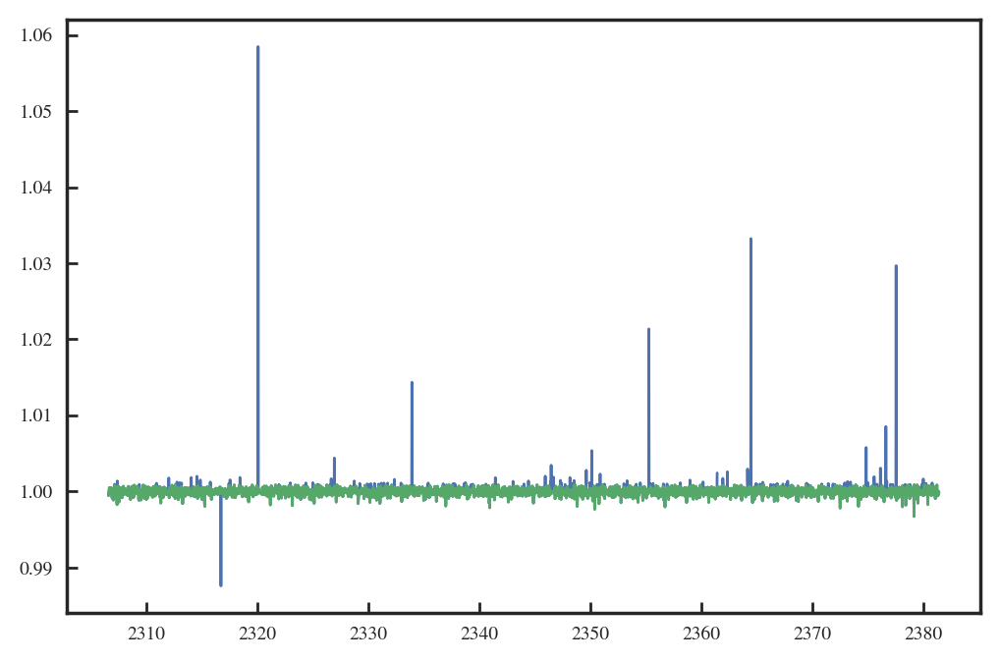

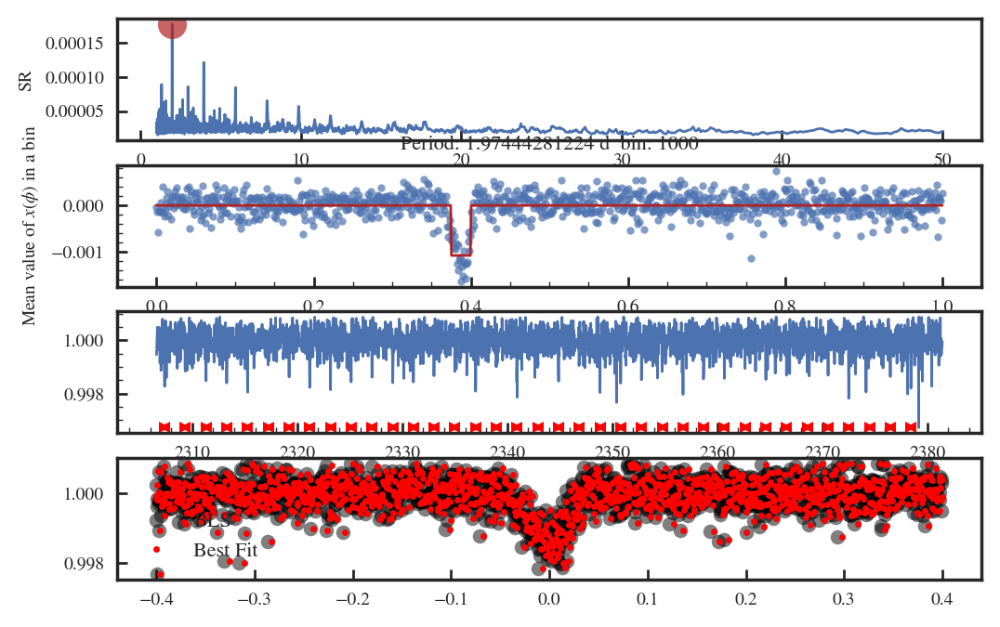

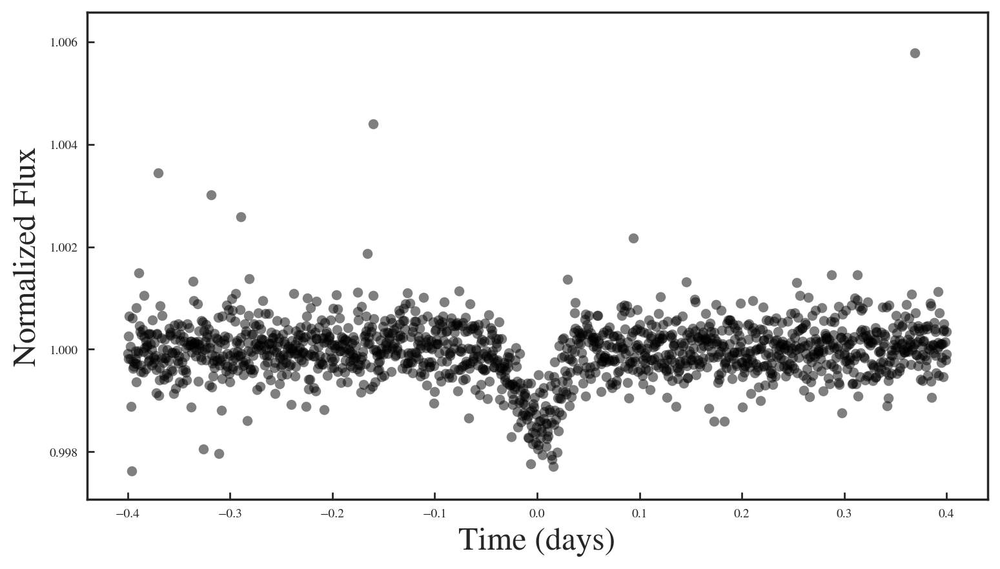

INFO  [everest.user.DownloadFile()]: Found cached file.
INFO  [everest.user.load_fits()]: Loading FITS file for 211969807.
('Transitmask:', array([2062, 2063, 2064, 2065, 2066, 2067, 2068, 2069, 2070, 2071,   33,
         34,   35,   36,   37,   38,   39,   40,   41,   42, 2159, 2160,
       2161, 2162, 2163, 2164, 2165, 2166, 2167, 2168,  130,  131,  132,
        133,  134,  135,  136,  137,  138,  139, 2256, 2257, 2258, 2259,
       2260, 2261, 2262, 2263, 2264,  226,  227,  228,  229,  230,  231,
        232,  233,  234,  235, 2352, 2353, 2354, 2355, 2356, 2357, 2358,
       2359, 2360, 2361,  323,  324,  325,  326,  327,  328,  329,  330,
        331,  332, 2449, 2450, 2451, 2452, 2453, 2454, 2455, 2456, 2457,
       2458,  420,  421,  422,  423,  424,  425,  426,  427,  428, 2546,
       2547, 2548, 2549, 2550, 2551, 2552, 2553, 2554,  516,  517,  518,
        519,  520,  521,  522,  523,  524,  525, 2642, 2643, 2644, 2645,
       2646, 2647, 2648, 2649, 2650, 2651,  613,  614,  6

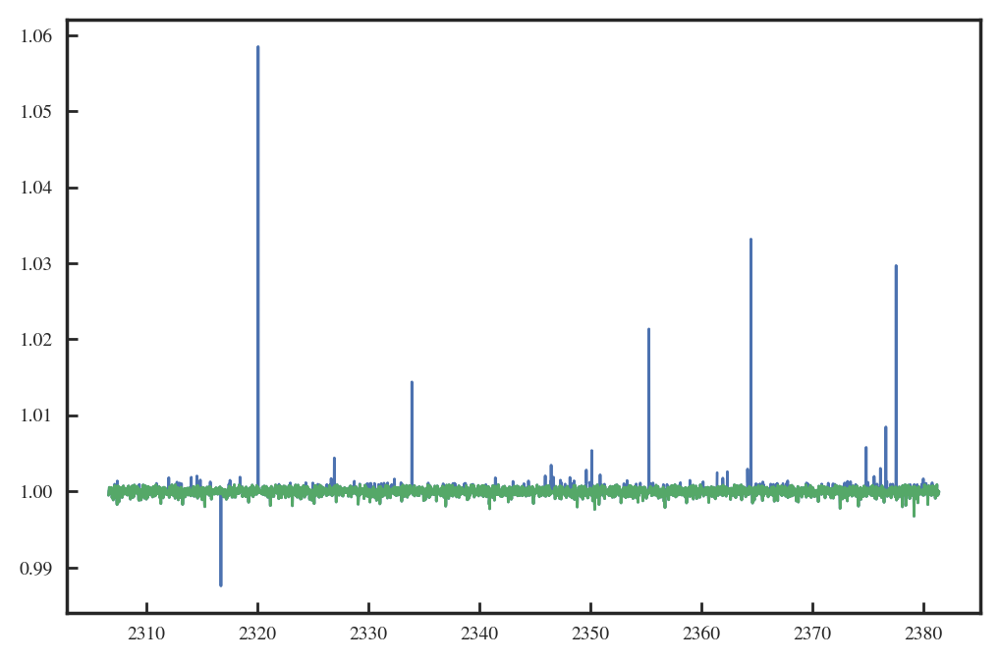

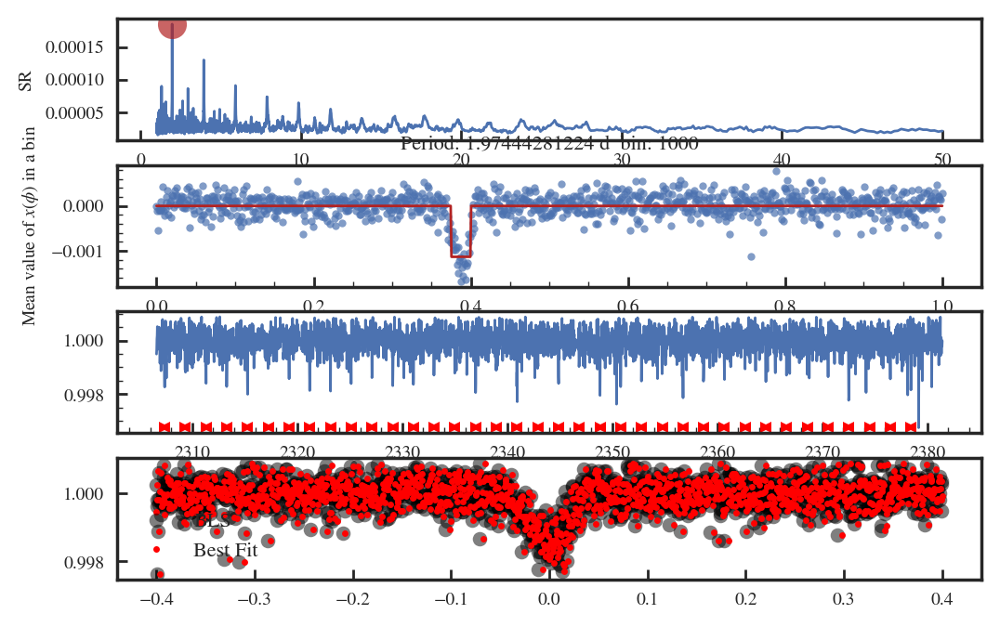

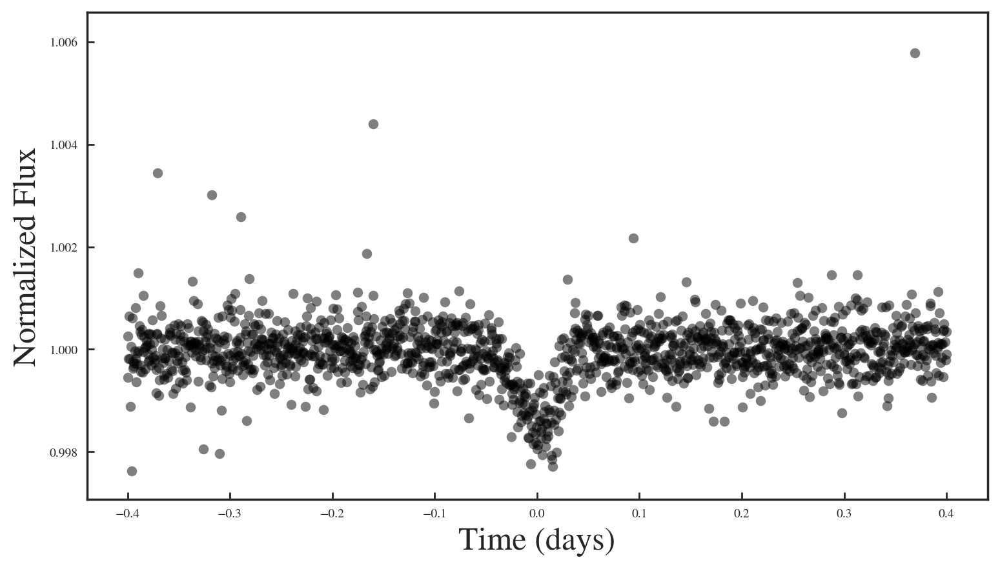

In [3]:
DUR = 0.2
EP = epicblsmulti.EVERESTBLS(211969807,sigma=15,sigma_upper=2.,flatten_method="GP")
planet = EP(dur=DUR)
EP = epicblsmulti.EVERESTBLS(211969807,sigma=15,sigma_upper=2.,flatten_method="GP",transitmask=EP.star.transitmask)
planet = EP(dur=DUR)

('Using planet with t0=', 2307.3781064818613, 'and P=', 1.974294724070611)
Using median filtered data -- assumes you have run that from beginning!


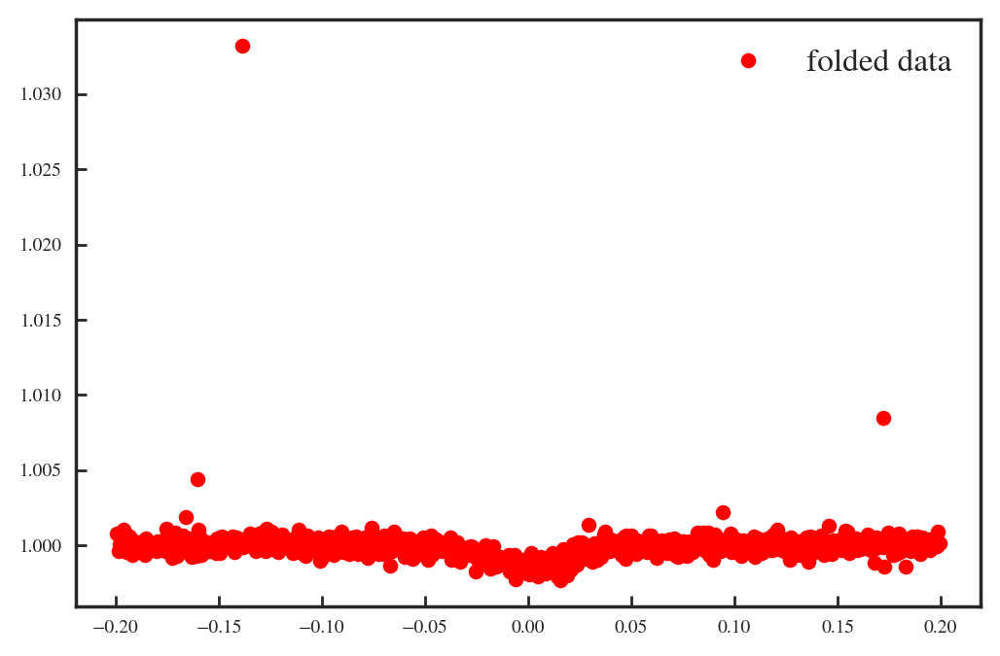

In [4]:
df = EP.get_cutout_phased_df(dur=0.4,sigma=None)
df = df.reset_index(drop=True)
df= df.sort_values("x")

742
[ 62  72 113 546 691]
737


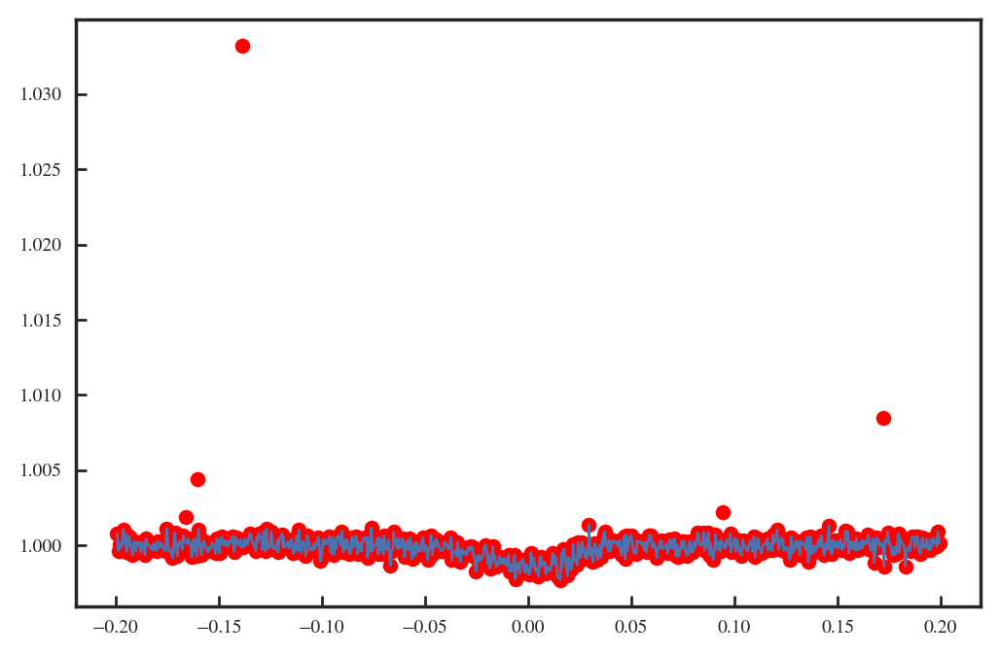

In [5]:
t,f,m,mm = k2help.median_filter_and_sigma_clip(df.x.values,df.y.values,return_mask=True,sigma=4.)
print(len(df))
print(m)
plt.plot(df.x, df.y,"r.")
dfmm= df.drop(m)
t_fold_final = dfmm.x
f_fold_final = dfmm.y
plt.plot(dfmm.x,dfmm.y)
print(len(dfmm))

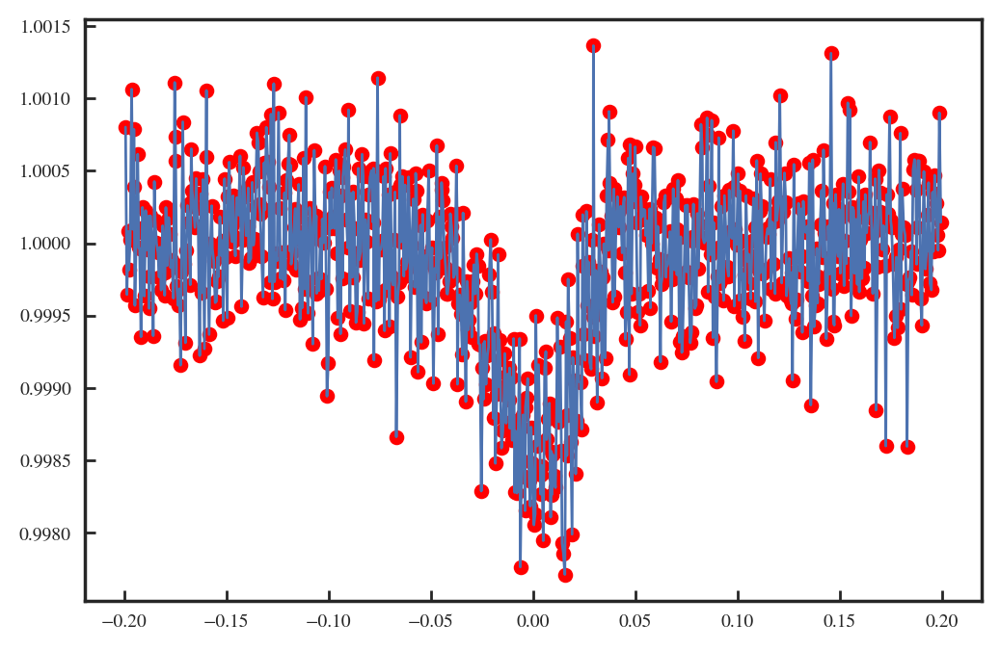

In [6]:
dfmm_s = dfmm.sort_index()
dfmm_s["time"] = dfmm_s.time.values + k2help.KEPLER_JD_OFFSET
plt.plot(dfmm_s.x,dfmm_s.y,"r.")
plt.plot(dfmm.x,dfmm.y)

In [7]:
dfmm_s.to_csv("../data/k2_104b/K2_data_k2_104b_final.csv")

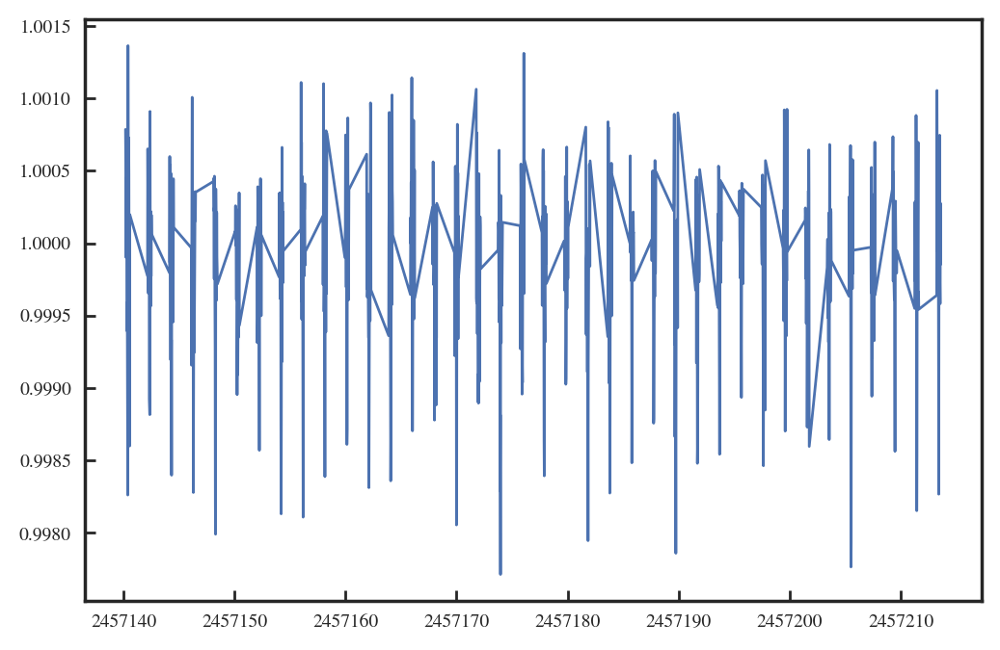

In [8]:
dfmm_s = dfmm_s.sort_values("index")
plt.plot(dfmm_s.time,dfmm_s.y)

In [9]:
import utils
_t0   = planet.get_attributeAndError("_pl_tranmid")[0]
ii   = planet.get_attributeAndError("_pl_orbincl")[0:2]
pp   = planet.get_attributeAndError("_pl_orbper")[0:2]
rprs = planet.get_attributeAndError("_pl_ratror")[0:2]
aRs  = planet.get_attributeAndError("_pl_ratdor")[0:2]

_p = np.log10(pp[0])
print("log(P)",mcmc_utils.err_logP_from_p(pp))
print("cos(i)",mcmc_utils.err_cosi_from_i(ii))
print("RpRs",rprs)
print("log(aRs)",mcmc_utils.err_logaRs_from_aRs(aRs))
print(_p)
print(_t0)

log(P) [0.2954119849513141, nan]
cos(i) [0.006709402064794567, nan]
RpRs (0.034304315900881371, nan)
log(aRs) [1.0721248961730789, nan]
0.295411984951
2457140.37811


# Read Ground Based 

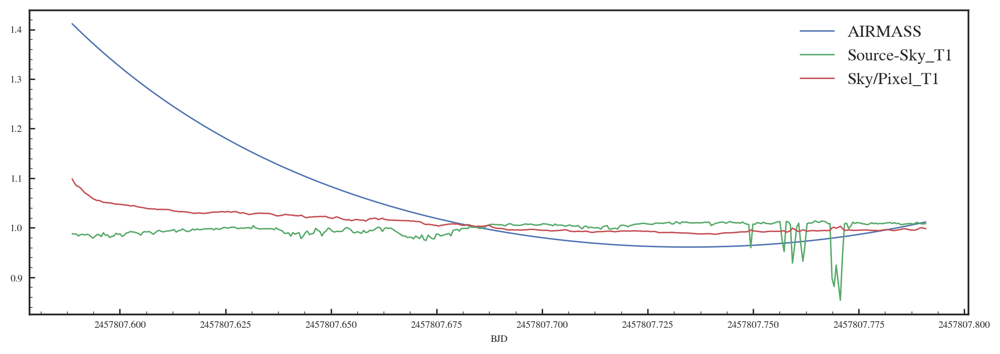

In [10]:
df_ground = pd.read_csv("../data/k2_104b/Processed_k2104b_fast_quad_4x4_1129_12_21_40_measurements.xls",sep="\t")
# Take out bad sky points
df_ground = df_ground[0:-20]

fig, ax = plt.subplots(figsize=(12,4))
ax.plot(df_ground.BJD_TDB,utils.norm_median(df_ground.AIRMASS))
ax.plot(df_ground.BJD_TDB,utils.norm_median(df_ground["Source-Sky_T1"]))
ax.plot(df_ground.BJD_TDB,((utils.norm_median(df_ground["Sky/Pixel_T1"])-1)*0.1)+1.)

ax.set_xlabel("BJD")
ax.legend(loc="upper right",fontsize=12)
ax.minorticks_on()

### Calculate Scintillation errorbars

In [11]:
# Define variables
t_ground = df_ground.BJD_TDB.values
f_ground = df_ground.rel_flux_T1.values/np.nanmedian(df_ground.rel_flux_T1.values)
err_ground = df_ground.rel_flux_err_T1.values/np.nanmedian(df_ground.rel_flux_T1.values)

# Other params
NREFSTARS = 5.
cadence = np.median(np.diff(t_ground))*24.*60.*60.
print("Cadence {}s".format(cadence))

# Calculate the mean values for scintillation and photon to plot on the plot
final_unbinned_scint_noise = utils.scintillation_noise(350.,np.mean(df_ground["AIRMASS"]),cadence,2700.,withextra=True)*np.sqrt(1.+1./NREFSTARS)
final_unbinned_phot_noise = np.mean(df_ground.rel_flux_err_T1)
print("Mean photon error: {}".format(final_unbinned_phot_noise))
print("Mean scint error: {}".format(final_unbinned_scint_noise))

# Calculate full array of errors including scintilation
scint_error = utils.scintillation_noise(350.,df_ground.AIRMASS.values,cadence,2700.,withextra=True)*np.sqrt(1.+1./NREFSTARS)
tot_error = np.sqrt(scint_error**2.+err_ground**2.)

Cadence 42.5952024758s
Mean photon error: 0.00053964109589
Mean scint error: 0.000287304753187


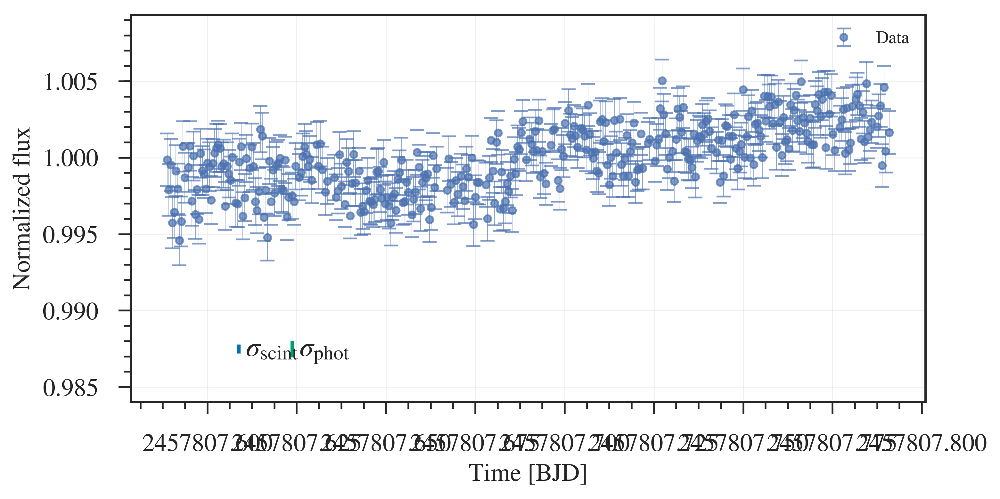

In [12]:
import plot_transits
fig, ax = plt.subplots(figsize=(8,4))
plot_transits.plot_transit_with_model(t_ground,f_ground,tot_error,ax=ax)
x0 = t_ground[0]
ax.errorbar(x0+0.01+0.01,0.9975-0.01,yerr=final_unbinned_scint_noise,elinewidth=2,color=cp[0],mew=0.5)
ax.errorbar(x0+0.025+0.01,0.9975-0.01,yerr=final_unbinned_phot_noise,elinewidth=2,color=cp[1],mew=0.5)
ax.text(x0+0.01+0.01+0.002,0.99741-0.0104,r"$\sigma_{\mathrm{scint}}$",fontsize=16)
ax.text(x0+0.025+0.01+0.002,0.99741-0.0104,r"$\sigma_{\mathrm{phot}}$",fontsize=16)

ax.set_xlabel("Time [BJD]",fontsize=14)
ax.set_ylabel("Normalized flux",fontsize=14)
ax.minorticks_on()
ax.legend(loc="upper right",fontsize=10)
ax.margins(x=0.05,y=0.15)
ax.grid(lw=0.5,alpha=0.3)

ax.tick_params(axis="both",labelsize=14)

In [13]:
#import astropylib

ii   = planet.get_attributeAndError("_pl_orbincl")[0:2]
pp   = planet.get_attributeAndError("_pl_orbper")[0:2]
rprs = planet.get_attributeAndError("_pl_ratror")[0:2]
aRs  = planet.get_attributeAndError("_pl_ratdor")[0:2]

_p = np.log10(pp[0])
_t0   = planet.get_attributeAndError("_pl_tranmid")[0]

print("log(P)",mcmc_utils.err_logP_from_p(pp))
print("cos(i)",mcmc_utils.err_cosi_from_i(ii))
print("RpRs",rprs)
print("log(aRs)",mcmc_utils.err_logaRs_from_aRs(aRs))
print(_p)
print(_t0)

log(P) [0.2954119849513141, nan]
cos(i) [0.006709402064794567, nan]
RpRs (0.034304315900881371, nan)
log(aRs) [1.0721248961730789, nan]
0.295411984951
2457140.37811


In [14]:
class LPFunction(object):
    """
    Log-Likelihood function class
    
    General philosophy:
    — Modify this for each fit
    — Outputs will be passed to emcee.sampler()
    — Outside of this are functions to plot the MCMC chains and corner plots
       
    NOTES:
    Based on hpprvi's awesome class, see: https://github.com/hpparvi/exo_tutorials
    
    I extended the Prior and Priorset classes in 
    /Users/gks/.local/lib/python2.7/site-packages/exotk
    """
    def __init__(self):
        """
        Note: number_pv_baseline must be set to whatever the index of the 'fraw' parameter is
        """
        # This is only performed during initialization
        self.data1= {"time"  : dfmm_s.time.values,  # phase folded time in days (centered on 0)
                    "flux"   : dfmm_s.y.values   # phase folded flux
                    }
        self.data2= {"time"   : df_ground.BJD_TDB.values,
                    "flux"   : df_ground.rel_flux_T1.values,
                    "error"  : df_ground.rel_flux_err_T1.values,
                    "line"   : (df_ground.BJD_TDB.values-df_ground.BJD_TDB.values[0])/np.nanmean(df_ground.BJD_TDB.values-df_ground.BJD_TDB.values[0]),
                    "airmass": df_ground.AIRMASS.values/np.nanmean(df_ground.AIRMASS.values),
                    "x"      : df_ground["X(FITS)_T1"].values/np.nanmean(df_ground["X(FITS)_T1"].values),
                    "y"      : df_ground["Y(FITS)_T1"].values/np.nanmean(df_ground["Y(FITS)_T1"].values)}
                    #"meridian": meridian}
        #####
        
        
        
        self.priors = [UP(2457807.6605-0.01    ,2457807.6605+0.01 , 'tc'       ,r'$T_C$'                 ,priortype="model"),  ##   0 - Transit centre, Tc
                       #UP( _t0 -0.01           , _t0+0.01               , 'tc'       ,r'$T_C$'                 ,priortype="model"),  ##   0 - Transit centre, Tc
                       UP( _p  -0.001          , _p +0.001              , 'logP'     ,r'$\log(P)$'             ,priortype="model"),  ##   1 - log(P)
                       #NP( np.log10(1.673906)  ,0.000012          , 'logP'     ,r'$\log(P)$'             ,priortype="model"),  ##   1 - log(P)
                       UP( 0                   ,0.2               , 'cos(i)'   ,r'$\cos(i)$'             ,priortype="model"),  ##   2 - cos(i)
                       UP( 0.0                 , 0.1                    , 'RpRs_1'     ,r'$R_p/R_s_1$'             ,priortype="model"),
                       UP( 0.0                 ,0.05              , 'RpRs_2'     ,r'$R_p/R_s_2$'             ,priortype="model"),  ##   3 - rp/rstar
                       UP(  0.9                 ,1.1              , 'log(a/Rs)',r'$\log(a/R_s)$'         ,priortype="model"),  ##   4 - log(a/rstar)     
                       #UP( 0.                 ,1.                , 'q1'       ,r'$q_1$'                 ,priortype="model"),  ##   5 - q1
                       #UP( 0.                 ,1.                , 'q2'       ,r'$q_2$'                 ,priortype="model"),  ##   6 - q2
                       UP( 0.378                ,0.386            , 'fraw2'     ,r'fraw2'                  ,priortype="baseline"),##  7 - Baseline constant
                       UP( 0.9                 , 1.1              , 'fraw1'     ,r'fraw1'                  ,priortype="baseline"),  ##   7 - Baseline constant
                       UP( -0.1                ,0.1               , 'line'     ,r'line'                  ,priortype="detrend"),##  8 - Line
                       UP(1e-5                , 100e-5           , 'err1'      ,r'error1'                 ,priortype="error")]  ##   8 - Baseline constant 
                       #UP( -0.1               , 0.1              , 'airmass'  ,r'airmass'               ,priortype="detrend"),##   9 - Airmass
                       #UP( -0.1               , 0.1              , 'x'        ,r'X'                     ,priortype="detrend")]##   10 - x
                       #UP( -0.1               , 0.1              , 'y'        ,r'Y'                     ,priortype="detrend")]##   11 - y      
        
        # If we want to fix limb-dark parameters
        #self.limbdark = [0.42662803,0.30760637]#[ 0.16689202, 0.44493439] 
        self.ps     = PriorSet(self.priors)
        print("Baseline1 is at pv=",self.pv_lab2Idx("fraw1"))
        print("Baseline2 is at pv=",self.pv_lab2Idx("fraw2"))
        print("Error is at pv=",self.pv_lab2Idx("err1"))
        
    def pv_lab2Idx(self,pv_label):
        return np.where(np.array(self.ps.labels)==pv_label)[0][0]
            
    def compute_transit(self,pv,times1=None,times2=None):
        """
        Calls BATMAN and returns the transit model
        
        INPUT:
        pv    - parameters passed to the function 
        times - times, and array of timestamps 
        
        OUTPUT:
        lc - the lightcurve model at *times*
        """
        # First transit, K2
        self.params1 = batman.TransitParams()
        self.params1.t0 = pv[self.pv_lab2Idx("tc")]
        self.params1.per = 10.**pv[self.pv_lab2Idx("logP")]
        self.params1.inc = np.arccos(pv[self.pv_lab2Idx("cos(i)")])*180./math.pi
        self.params1.rp = pv[self.pv_lab2Idx("RpRs_1")]
        self.params1.a = 10.**pv[self.pv_lab2Idx("log(a/Rs)")]
        self.params1.ecc = 0.
        self.params1.w = 0.
        #q1, q2 = pv[self.pv_lab2Idx("q1_1")], pv[self.pv_lab2Idx("q2_1")]
        #self.params1.u = mcFunc.u1_u2_from_q1_q2(q1,q2) # Kipping 2013 formalism
        self.params1.u = [0.42455249,0.30294699]
        self.params1.limb_dark = "quadratic"
        self.params1.fp = 0.001
        if times1 is None:
            times1 = self.data1["time"]
        transitmodel = batman.TransitModel(self.params1, times1, transittype='primary',supersample_factor=7,exp_time=0.020431801470066003)
        self.lc1 = transitmodel.light_curve(self.params1)
        
        # Second transit, ground,
        self.params2 = batman.TransitParams()
        self.params2.t0 = pv[self.pv_lab2Idx("tc")]
        self.params2.per = 10.**pv[self.pv_lab2Idx("logP")]
        self.params2.inc = np.arccos(pv[self.pv_lab2Idx("cos(i)")])*180./math.pi
        self.params2.rp = pv[self.pv_lab2Idx("RpRs_2")]
        self.params2.a = 10.**pv[self.pv_lab2Idx("log(a/Rs)")]
        self.params2.ecc = 0.
        self.params2.w = 0.
        #q1, q2 = pv[self.pv_lab2Idx("q1_2")], pv[self.pv_lab2Idx("q2_2")]
        #self.params2.u = mcFunc.u1_u2_from_q1_q2(q1,q2) # Kipping 2013 formalism
        self.params2.u = [0.34426597,0.3186842]
        self.params2.limb_dark = "quadratic"
        self.params2.fp = 0.001
        if times2 is None:
            times2 = self.data2["time"]
        transitmodel = batman.TransitModel(self.params2, times2, transittype='primary')
        self.lc2 = transitmodel.light_curve(self.params2)

        return self.lc1, self.lc2      
    
    def detrend(self,pv):
        """
        A function to detrend.
        
        INPUT:
            pv - an array containing a sample draw of the parameters defined in self.lpf.ps
        
        OUTPUT:
            detrend/pv[self.number_pv_baseline] - the additional trend in the data (no including transit)
        """
        detrend = np.zeros(len(self.data2["flux"]))
        
        # loop over detrend parameters
        for i in self.ps.get_param_type_indices(paramtype="detrend"):
            detrend += pv[i]*(self.data2[self.ps.labels[i]]-1.)
        return detrend/pv[self.pv_lab2Idx("fraw2")]
        
    def compute_lc_model(self,pv):
        """
        Compute the light curve model with detrend
        
        INPUT:
            pv - an array containing a sample draw of the parameters defined in self.lpf.ps
        
        OUTPUT:
            The full light curve model with a trend
        """
        f1, f2 = self.compute_transit(pv)
        # Return the flux from K2, and then detrended flux from ground
        return f1, f2 + self.detrend(pv)
                    
    def __call__(self,pv):
        """
        Return the log likelihood
        NOTES:
            This is done each time an instance is called
        """
        # If priors are outside of bounds, return -inf
        if any(pv < self.ps.pmins) or any(pv>self.ps.pmaxs):
            return -np.inf
        # make sure that sqrtecosw is well behaved
        flux_m1, flux_m2 = self.compute_lc_model(pv)
        
        # Return the log-likelihood
        log_of_priors = self.ps.c_log_prior(pv)
        
        scaled_flux1  = self.data1["flux"]/pv[self.pv_lab2Idx("fraw1")]
        scaled_flux2  = self.data2["flux"]/pv[self.pv_lab2Idx("fraw2")]
        
        log_of_model1  = ll_normal_es(scaled_flux1, flux_m1, pv[self.pv_lab2Idx("err1")])
        log_of_model2  = ll_normal_ev(scaled_flux2, flux_m2, self.data2["error"])

        log_ln = log_of_priors + log_of_model1 + log_of_model2
        
        return log_ln

In [15]:
import trf
# Initialize an instance of the Transit Fitter Class, using the LPFunction as defined above
TF = trf.TransitFit(LPFunction)

Baseline1 is at pv= 7
Baseline2 is at pv= 6
Error is at pv= 9


In [16]:
TF.minimize_PyDE(mcmc=False)

Running PyDE Optimizer
Optimized using PyDE
Final parameters:
      labels       centers         lower         upper            pv  center_dist
0         tc  2.457808e+06  2.457808e+06  2.457808e+06  2.457808e+06     0.000367
1       logP  2.954120e-01  2.944120e-01  2.964120e-01  2.953948e-01     0.000017
2     cos(i)  1.000000e-01  0.000000e+00  2.000000e-01  1.034249e-02     0.089658
3     RpRs_1  5.000000e-02  0.000000e+00  1.000000e-01  2.960642e-02     0.020394
4     RpRs_2  2.500000e-02  0.000000e+00  5.000000e-02  3.906316e-02    -0.014063
5  log(a/Rs)  1.000000e+00  9.000000e-01  1.100000e+00  1.054384e+00    -0.054384
6      fraw2  3.820000e-01  3.780000e-01  3.860000e-01  3.819671e-01     0.000033
7      fraw1  1.000000e+00  9.000000e-01  1.100000e+00  9.999241e-01     0.000076
8       line  0.000000e+00 -1.000000e-01  1.000000e-01  8.042505e-04    -0.000804
9       err1  5.050000e-04  1.000000e-05  1.000000e-03  5.459790e-04    -0.000041
LogLn value: -5765.41626864
Log prio

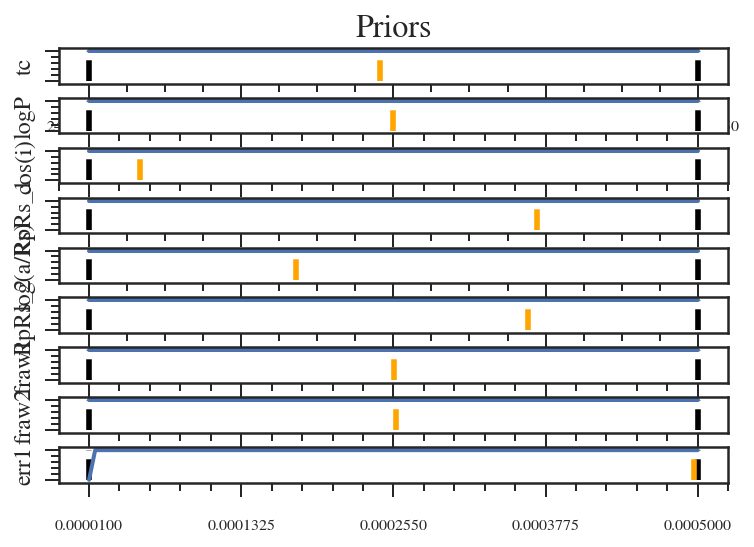

In [15]:
TF.lpf.ps.plot_all(TF.min_pv)

In [16]:
TF.minimize_PyDE(mc_iter=1000)

Running PyDE Optimizer
Optimized using PyDE
Final parameters:
      labels       centers         lower         upper            pv  center_dist
0         tc  2.457808e+06  2.457808e+06  2.457808e+06  2.457808e+06     0.001071
1       logP  2.954120e-01  2.944120e-01  2.964120e-01  2.953906e-01     0.000021
2     cos(i)  1.000000e-01  0.000000e+00  2.000000e-01  3.475850e-02     0.065241
3     RpRs_1  5.000000e-02  0.000000e+00  1.000000e-01  3.433221e-02     0.015668
4     RpRs_2  2.500000e-02  0.000000e+00  5.000000e-02  3.869684e-02    -0.013697
5  log(a/Rs)  1.000000e+00  9.000000e-01  1.100000e+00  1.030414e+00    -0.030414
6      fraw2  3.820000e-01  3.780000e-01  3.860000e-01  3.819716e-01     0.000028
7      fraw1  1.000000e+00  9.000000e-01  1.100000e+00  1.000013e+00    -0.000013
8       line  0.000000e+00 -1.000000e-01  1.000000e-01  8.092553e-04    -0.000809
9       err1  5.050000e-04  1.000000e-05  1.000000e-03  4.289412e-04     0.000076
LogLn value: -5821.96072304
Log prio

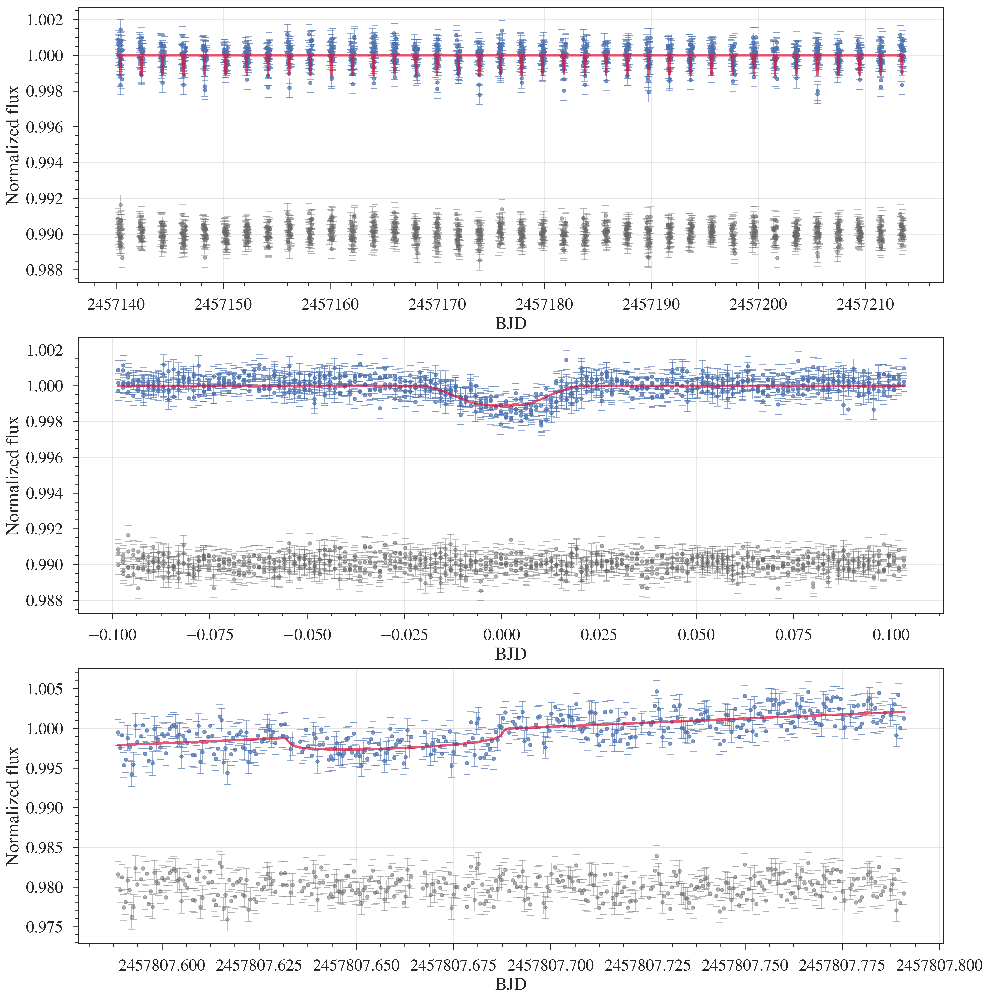

In [17]:
pv = TF.min_pv
t0  = pv[0]
p  = 10.**(pv[1])
phases_data = utils.get_phases(TF.lpf.data1["time"],p,t0)
phases_fit = utils.get_phases(TF.lpf.data1["time"],p,t0)

model_trend1, model_trend2 = TF.lpf.compute_lc_model(pv)

scaled_flux1 = TF.lpf.data1["flux"]/pv[TF.lpf.pv_lab2Idx("fraw1")]
scaled_flux2 = TF.lpf.data2["flux"]/pv[TF.lpf.pv_lab2Idx("fraw2")]

df_fold = pd.DataFrame(zip(phases_fit,model_trend1,scaled_flux1),columns=["phase","model","scaled_flux"]).sort_values("phase")

residual1 = scaled_flux1 - model_trend1
residual2 = scaled_flux2 - model_trend2

scaled_error1 = pv[TF.lpf.pv_lab2Idx("err1")]/pv[TF.lpf.pv_lab2Idx("fraw1")]
scaled_error2 = TF.lpf.data2["error"]/pv[TF.lpf.pv_lab2Idx("fraw2")]

# Plot transits
fig, axx = plt.subplots(nrows=3,figsize=(18,20))
ax,bx,cx = axx
plot_transits.plot_transit_with_model(TF.lpf.data1["time"],
                        scaled_flux1,
                        scaled_error1,
                        yresidual=residual1,
                        xmodel=TF.lpf.data1["time"],
                        ymodel=model_trend1,ax=ax)
plot_transits.plot_transit_with_model(df_fold.phase,
                        df_fold.scaled_flux,
                        scaled_error1,
                        yresidual=residual1,
                        xmodel=df_fold.phase,
                        ymodel=df_fold.model,ax=bx)
plot_transits.plot_transit_with_model(TF.lpf.data2["time"],
                        scaled_flux2,
                        scaled_error2,
                        yresidual=residual2,
                        xmodel=TF.lpf.data2["time"],
                        ymodel=model_trend2,
                        offset=0.98,ax=cx)

In [20]:
#TF.plot_chains()

In [21]:
#TF.plot_corner(burn=400,show_titles=True)

In [17]:
df = TF.get_df_flatchain()

In [18]:
df["P"] = 10.**df["logP"].values
df["i"] = np.rad2deg(np.arccos(df["cos(i)"].values))
df["aRs"] = 10.**df["log(a/Rs)"].values
# K2 parameters
df_param_k2 = TF.get_transit_parameters_from_arrays(df['tc'].values,
                                                 df['P'].values,
                                                 df['i'].values,
                                                 df['RpRs_1'].values,
                                                 df['aRs'].values,
                                                 st_rad=0.48,
                                     st_raderr1=0.02,
                                     st_teff=3660.,
                                     st_teff_err1=67.,
                                     rho_instead_of_aRs=False)
# Ground based parameters
df_param_ground = TF.get_transit_parameters_from_arrays(df['tc'].values,
                                                 df['P'].values,
                                                 df['i'].values,
                                                 df['RpRs_2'].values,
                                                 df['aRs'].values,
                                                 st_rad=0.48,
                                     st_raderr1=0.02,
                                     st_teff=3660.,
                                     st_teff_err1=67.,
                                     rho_instead_of_aRs=False)

Assuming
R_s: 0.48 +- 0.02
Teff: 3660.0 +- 67.0
Albedo: 0.3
Assuming
R_s: 0.48 +- 0.02
Teff: 3660.0 +- 67.0
Albedo: 0.3


### Ground-based parameters

In [19]:
df_param_ground

,medvals,minus,plus,values,Labels,Description
0,2.457808e+06,0.000449,0.000833,$2457807.66018_{-0.00045}^{+0.00083}$,$T_{0}$ $(\mathrm{BJD_{TDB}})$,Transit Midpoint
1,1.974202e+00,0.000003,0.000004,$1.974202_{-0.000003}^{+0.000004}$,$P$ (days),Orbital period
2,3.929769e-02,0.000938,0.000937,$0.0393_{-0.00094}^{+0.00094}$,$R_p/R_*$,Radius ratio
3,2.056287e+00,0.097445,0.099905,$2.056_{-0.097}^{+0.100}$,$R_p (R_\oplus)$,Planet radius
4,1.834499e-01,0.008693,0.008913,$0.1834_{-0.0087}^{+0.0089}$,$R_p (R_J)$,Planet radius
5,1.544308e-03,0.000073,0.000074,$0.001544_{-0.00007}^{+0.00007}$,$\delta$,Transit depth
6,1.129869e+01,0.905574,0.474180,$11.3_{-0.91}^{+0.47}$,$a/R_*$,Normalized orbital radius
7,2.501527e-02,0.002094,0.001682,$0.025_{-0.0021}^{+0.0017}$,$a$ (AU),Semi-major axis
8,7.000892e+00,1.552050,0.918927,$7.0_{-1.6}^{+0.92}$,"$\rho_{\mathrm{*,transit}}$ ($\mathrm{g/cm^{3}}$)",Density of star
9,8.853580e+01,1.170566,0.914298,$88.54_{-1.2}^{+0.91}$,$i$ $(^{\circ})$,Transit inclination


### Parameters from K2 

In [20]:
df_param_k2

,medvals,minus,plus,values,Labels,Description
0,2.457808e+06,0.000449,0.000833,$2457807.66018_{-0.00045}^{+0.00083}$,$T_{0}$ $(\mathrm{BJD_{TDB}})$,Transit Midpoint
1,1.974202e+00,0.000003,0.000004,$1.974202_{-0.000003}^{+0.000004}$,$P$ (days),Orbital period
2,3.431550e-02,0.000799,0.000932,$0.03432_{-0.00080}^{+0.00093}$,$R_p/R_*$,Radius ratio
3,1.797964e+00,0.085594,0.089151,$1.798_{-0.086}^{+0.089}$,$R_p (R_\oplus)$,Planet radius
4,1.604038e-01,0.007636,0.007953,$0.1604_{-0.0076}^{+0.0080}$,$R_p (R_J)$,Planet radius
5,1.177554e-03,0.000054,0.000065,$0.001178_{-0.00005}^{+0.00006}$,$\delta$,Transit depth
6,1.129869e+01,0.905574,0.474180,$11.3_{-0.91}^{+0.47}$,$a/R_*$,Normalized orbital radius
7,2.501763e-02,0.002086,0.001679,$0.025_{-0.0021}^{+0.0017}$,$a$ (AU),Semi-major axis
8,7.000892e+00,1.552050,0.918927,$7.0_{-1.6}^{+0.92}$,"$\rho_{\mathrm{*,transit}}$ ($\mathrm{g/cm^{3}}$)",Density of star
9,8.853580e+01,1.170566,0.914298,$88.54_{-1.2}^{+0.91}$,$i$ $(^{\circ})$,Transit inclination


In [21]:
df_k2_104b_jointground_final=pd.DataFrame({'Labels': df_param_ground['Labels'],'Description':df_param_ground['Description'],'Ground': df_param_ground['values']})
#df_k2_28b_final
df_k2_104b_jointground_final.to_csv('../data/k2_104b/k2-104b_jointground_for_latex_table.csv')

In [22]:
df_k2_104b_jointk2_final=pd.DataFrame({'Labels': df_param_k2['Labels'],'Description':df_param_k2['Description'],'K2': df_param_k2['values']})
#df_k2_28b_final
df_k2_104b_jointk2_final.to_csv('../data/k2_104b/k2-104b_jointk2_for_latex_table.csv')

# Plot with MCMC joint parameters

In [23]:
pv = TF.get_mean_values_mcmc_posteriors().medvals.values
t0  = TF.get_mean_values_mcmc_posteriors().medvals.values[0]
p  = 10.**TF.get_mean_values_mcmc_posteriors().medvals.values[1]
phases_data = utils.get_phases(TF.lpf.data1["time"],p,t0)
phases_fit = utils.get_phases(TF.lpf.data1["time"],p,t0)
model_trend1, model_trend2 = TF.lpf.compute_lc_model(pv)
model_trend1_no_trend,model_trend2_no_trend= TF.lpf.compute_transit(pv)

scaled_flux1 = TF.lpf.data1["flux"]/pv[TF.lpf.pv_lab2Idx("fraw1")]
scaled_flux2 = TF.lpf.data2["flux"]/pv[TF.lpf.pv_lab2Idx("fraw2")]
scaled_flux2_no_trend = scaled_flux2 - TF.lpf.detrend(pv)

df_fold = pd.DataFrame(zip(phases_fit,model_trend1,scaled_flux1),columns=["phase","model","scaled_flux"]).sort_values("phase")

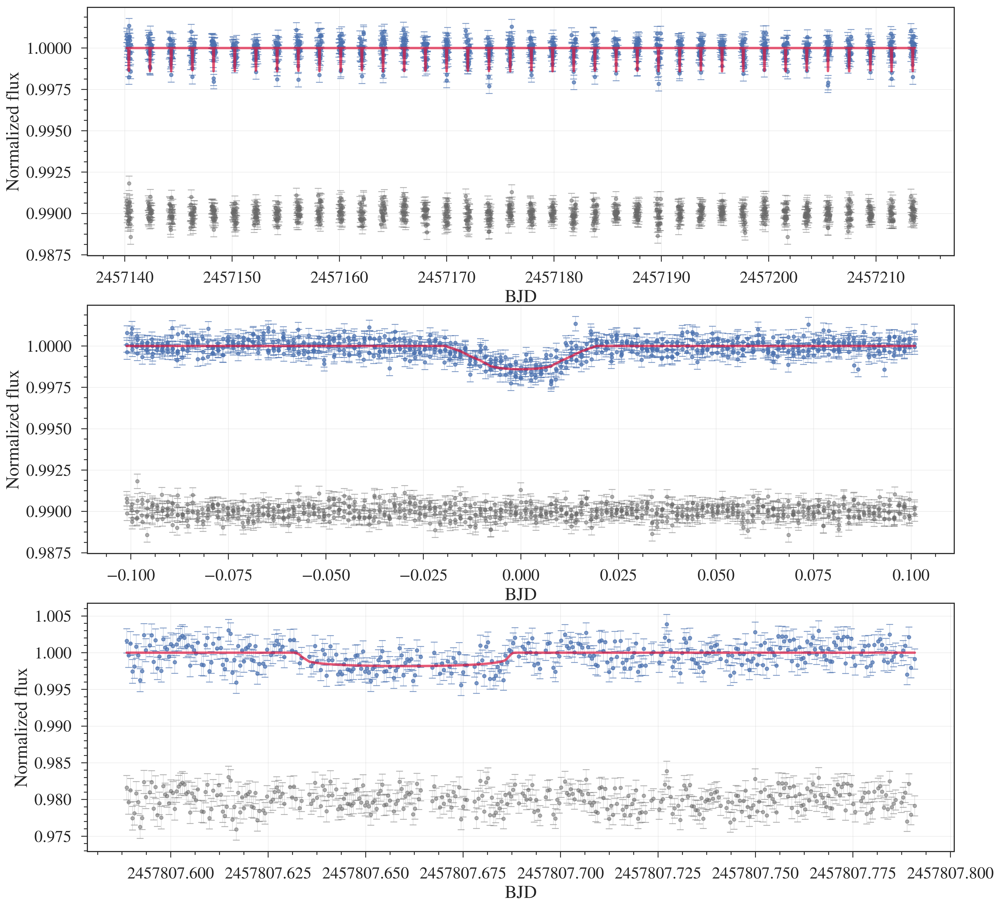

In [24]:
residual1 = scaled_flux1 - model_trend1
residual2 = scaled_flux2 - model_trend2

scaled_error1 = pv[TF.lpf.pv_lab2Idx("err1")]/pv[TF.lpf.pv_lab2Idx("fraw1")]
scaled_error2 = TF.lpf.data2["error"]/pv[TF.lpf.pv_lab2Idx("fraw2")]

# Plot transits
fig, axx = plt.subplots(nrows=3,figsize=(18,18))
ax,bx,cx = axx
p1=plot_transits.plot_transit_with_model(TF.lpf.data1["time"],
                        scaled_flux1,
                        scaled_error1,
                        yresidual=residual1,
                        xmodel=TF.lpf.data1["time"],
                        ymodel=model_trend1,ax=ax)
plot_transits.plot_transit_with_model(df_fold.phase,
                        df_fold.scaled_flux,
                        scaled_error1,
                        yresidual=residual1,
                        xmodel=df_fold.phase,
                        ymodel=df_fold.model,ax=bx)
plot_transits.plot_transit_with_model(TF.lpf.data2["time"],
                        scaled_flux2_no_trend,
                        scaled_error2,
                        yresidual=residual2,
                        xmodel=TF.lpf.data2["time"],
                        ymodel=model_trend2_no_trend,
                        offset=0.98,ax=cx)

In [25]:
d = {'phase_fold_time_k2': df_fold.phase, 'phase_fold_scaled_flux_k2': df_fold.scaled_flux, 'scaled_error_k2':scaled_error1,
    'yresidual_k2': residual1, 'xmodel_k2':df_fold.phase, 'ymodel_k2':df_fold.model }
k2_data_for_plotting=pd.DataFrame(data=d)
k2_data_for_plotting.to_csv("../data/k2_104b/K2_data_k2_104b_for_plotting_k2.csv")

In [26]:
d = {'time_ground': TF.lpf.data2["time"], 'scaled_flux_ground': scaled_flux2_no_trend, 'scaled_error_ground':scaled_error2,
    'yresidual_ground': residual2, 'xmodel_ground': TF.lpf.data2["time"], 'ymodel_ground':model_trend2_no_trend}
ground_data_for_plotting=pd.DataFrame(data=d)
ground_data_for_plotting.to_csv("../data/k2_104b/K2_data_k2_104b_for_plotting_ground.csv")